# Paper figures (draft): init_scale × sparsity × task similarity

This notebook drafts final paper-style figures from the existing simulation outputs.

**Default architecture:** task-routed two-module RNN (25 hidden per module, `nb_steps=2`).

**Minimal comparison grid (task-routed):**
- **sparsity** ∈ {`no_comms`, `0.5`, `1.0`}
- **task similarity** ∈ {`same`, `near`, `far`}
- **init_scale** ∈ {`0.01`, `0.1`, `1.0`}

**Ablations:** shared routing (matched settings) treated as ablation (optionally add `single_module`).

## Figures in this draft
- Transfer/interference (`error_diff`) + phase accuracies
- Principal angles (A vs B subspaces)
- PC count across phases (`n_pcs_99`, 99% variance)
- Curated 2D PCA geometry snapshots


In [1]:
# 1) Setup

import os
import sys
import json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

SIMILARITY_ORDER = ["same", "near", "far"]
SIMILARITY_PALETTE = {"same": "green", "near": "orange", "far": "blue"}

PHASE_ORDER = ["post_A", "post_B", "post_A2"]

# We keep the same global ordering conventions as the existing notebooks.
INIT_SCALE_ORDER = [0.01, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0]
SPARSITY_ORDER = ["no_comms", "0.1", "0.3", "0.5", "0.7", "0.9", "1.0", "single_module"]

# Minimal paper grid
PAPER_INIT_SCALES = [0.01, 0.1, 1.0, 10]
PAPER_SPARSITIES = ["no_comms", "0.5", "1.0"]

project_root = Path(os.getcwd()).resolve()
while not (project_root / "a1b2").exists():
    if project_root == project_root.parent:
        raise RuntimeError("Project root (containing a1b2) not found.")
    project_root = project_root.parent

sys.path.insert(0, str(project_root))
os.chdir(project_root)

from a1b2.utils.run_config import build_run_id
from a1b2.analysis import transfer_interference as ann
from a1b2.analysis.transfer_interference import prepare_pca_single_task
from a1b2.utils.figure_settings import task_colours
from a1b2.utils.figure_utils import plot_split_stim, get_axis_limits

sim_folder = (project_root / "data" / "simulations")
config_path = (project_root / "a1b2" / "models" / "experiments.json")
settings = json.loads(config_path.read_text())

print("Project root:", project_root)
print("Simulations folder:", sim_folder)
print("Config:", config_path)


Project root: /home/kat/workspace/Structure-Function-Analysis-of-Network-Topologies/a1b2_modular
Simulations folder: /home/kat/workspace/Structure-Function-Analysis-of-Network-Topologies/a1b2_modular/data/simulations
Config: /home/kat/workspace/Structure-Function-Analysis-of-Network-Topologies/a1b2_modular/a1b2/models/experiments.json


In [2]:
# 2) Select runs for the paper grid (task-routed default + shared ablation)

TARGET_ARCH = "two_module_rnn"
TARGET_DIM_HIDDEN = 50
TARGET_NB_STEPS = 2
TARGET_COMMON_READOUT = True
TARGET_COMMON_INPUT = False


def sparsity_label_from_condition(c):
    sp = c.get("sparsity", 1.0)
    if sp == 0 or "no_comms" in c.get("name", ""):
        return "no_comms"
    sf = float(sp)
    return "1.0" if np.isclose(sf, 1.0) else str(sf)


def init_scale_from_condition(c):
    init_scale = c.get("init_scale", None)
    return float(1.0 if init_scale is None else init_scale)


def select_conditions(input_routing: str):
    conds = []
    for c in settings["conditions"]:
        if c.get("arch") != TARGET_ARCH:
            continue
        if c.get("dim_hidden") != TARGET_DIM_HIDDEN:
            continue
        if c.get("nb_steps", 1) != TARGET_NB_STEPS:
            continue
        if c.get("common_readout", True) is not TARGET_COMMON_READOUT:
            continue
        if c.get("common_input", False) is not TARGET_COMMON_INPUT:
            continue
        if c.get("input_routing", "shared") != input_routing:
            continue

        sp_label = sparsity_label_from_condition(c)
        init_scale = init_scale_from_condition(c)

        if sp_label not in PAPER_SPARSITIES:
            continue
        if init_scale not in PAPER_INIT_SCALES:
            continue

        run_id = build_run_id(c)
        path = sim_folder / run_id
        conds.append(
            {
                **c,
                "run_id": run_id,
                "path": str(path),
                "path_exists": path.exists(),
                "sparsity_label": sp_label,
                "init_scale": init_scale,
            }
        )

    df = pd.DataFrame(conds)
    if df.empty:
        return df

    df["sparsity_label"] = pd.Categorical(df["sparsity_label"], categories=SPARSITY_ORDER, ordered=True)
    df = df.sort_values(["sparsity_label", "init_scale", "name"]).reset_index(drop=True)
    return df


task_df = select_conditions("task_routed")
shared_df = select_conditions("shared")

print("Task-routed selected:", len(task_df), "valid:", int(task_df["path_exists"].sum()))
print("Shared selected:", len(shared_df), "valid:", int(shared_df["path_exists"].sum()))

display(task_df[["name", "run_id", "init_scale", "sparsity_label", "path_exists"]])
display(shared_df[["name", "run_id", "init_scale", "sparsity_label", "path_exists"]])


Task-routed selected: 11 valid: 11
Shared selected: 10 valid: 9


,name,run_id,init_scale,sparsity_label,path_exists
0,two_module_rnn_50_task_routed_no_comms_nb2_ini...,two_module_rnn_50_task_routed_no_comms_nb2_ini...,0.01,no_comms,True
1,two_module_rnn_50_task_routed_no_comms_nb2_ini...,two_module_rnn_50_task_routed_no_comms_nb2_ini...,0.10,no_comms,True
2,two_module_rnn_50_task_routed_no_comms_nb2,two_module_rnn_50_task_routed_no_comms_nb2_nb2...,1.00,no_comms,True
3,two_module_rnn_50_task_routed_sp05_nb2_init0.01,two_module_rnn_50_task_routed_sp05_nb2_init0.0...,0.01,0.5,True
4,two_module_rnn_50_task_routed_sp05_nb2_init0.1,two_module_rnn_50_task_routed_sp05_nb2_init0.1...,0.10,0.5,True
5,two_module_rnn_50_task_routed_sp05_nb2,two_module_rnn_50_task_routed_sp05_nb2_nb2_tas...,1.00,0.5,True
6,two_module_rnn_50_task_routed_sp05_nb2_init10,two_module_rnn_50_task_routed_sp05_nb2_init10_...,10.00,0.5,True
7,two_module_rnn_50_task_routed_nb2_init0.01,two_module_rnn_50_task_routed_nb2_init0.01_nb2...,0.01,1.0,True
8,two_module_rnn_50_task_routed_nb2_init0.1,two_module_rnn_50_task_routed_nb2_init0.1_nb2_...,0.10,1.0,True
9,two_module_rnn_50_task_routed_nb2,two_module_rnn_50_task_routed_nb2_nb2_task_rou...,1.00,1.0,True


,name,run_id,init_scale,sparsity_label,path_exists
0,two_module_rnn_50_no_comms_nb2_init0.01,two_module_rnn_50_no_comms_nb2_init0.01_nb2_sh...,0.01,no_comms,True
1,two_module_rnn_50_no_comms_nb2_init0.1,two_module_rnn_50_no_comms_nb2_init0.1_nb2_sha...,0.10,no_comms,False
2,two_module_rnn_50_no_comms_nb2,two_module_rnn_50_no_comms_nb2_nb2_shared_sp0_...,1.00,no_comms,True
3,two_module_rnn_50_sp05_nb2_init0.01,two_module_rnn_50_sp05_nb2_init0.01_nb2_shared...,0.01,0.5,True
4,two_module_rnn_50_sp05_nb2_init0.1,two_module_rnn_50_sp05_nb2_init0.1_nb2_shared_...,0.10,0.5,True
5,two_module_rnn_50_sp05_nb2,two_module_rnn_50_sp05_nb2_nb2_shared_sp0.5_se...,1.00,0.5,True
6,two_module_rnn_50_nb2_init0.01,two_module_rnn_50_nb2_init0.01_nb2_shared_sp1....,0.01,1.0,True
7,two_module_rnn_50_nb2_init0.1,two_module_rnn_50_nb2_init0.1_nb2_shared_sp1.0...,0.10,1.0,True
8,two_module_rnn_50_nb2,two_module_rnn_50_nb2_nb2_shared_sp1.0_sep_cr_RNN,1.00,1.0,True
9,two_module_rnn_50_nb2_init10,two_module_rnn_50_nb2_init10_nb2_shared_sp1.0_...,10.00,1.0,True


In [3]:
# 3) Load ANN data + build participant-level dataframes (transfer, phase accuracies, rep metrics, angles)

from collections import defaultdict


def load_all_ann_data(df_runs: pd.DataFrame):
    out = {}
    for _, row in df_runs[df_runs["path_exists"]].iterrows():
        run_id = row["run_id"]
        path = Path(row["path"])
        ann_data = ann.load_ann_data(path)
        out[run_id] = {
            "data": ann_data,
            "init_scale": float(row["init_scale"]),
            "sparsity_label": str(row["sparsity_label"]),
        }
    return out


def compute_metrics(all_ann_data: dict):
    transfer_records = []
    accuracy_records = []
    rep_records = []
    angles_records = []

    for run_id, bundle in all_ann_data.items():
        ann_data = bundle["data"]
        init_scale = bundle["init_scale"]
        sp_label = bundle["sparsity_label"]

        # principal angles (A vs B)
        angles_df = ann.get_principal_angles(ann_data)
        angles_df = angles_df.copy()
        angles_df["run_id"] = run_id
        angles_df["init_scale"] = init_scale
        angles_df["sparsity_label"] = sp_label
        angles_records.append(angles_df)

        # participant-level metrics
        for cond_name, entries in ann_data.items():
            if cond_name not in SIMILARITY_ORDER:
                continue
            for entry in entries:
                pid = str(entry.get("participant"))

                acc = np.asarray(entry["accuracy"])
                if acc.ndim == 3:
                    cond_idx = SIMILARITY_ORDER.index(cond_name)
                    acc_cond = acc[cond_idx]
                else:
                    acc_cond = acc

                # Transfer (error_diff): init_B - final_A1
                if acc_cond.ndim >= 2 and acc_cond.shape[0] >= 2:
                    A1_acc = acc_cond[0, 1::2]
                    B_acc = acc_cond[1, 1::2]
                    if len(A1_acc) >= 6 and len(B_acc) >= 6:
                        final_A1 = float(np.mean(A1_acc[-6:]))
                        init_B = float(np.mean(B_acc[:6]))
                        transfer_records.append(
                            {
                                "run_id": run_id,
                                "init_scale": init_scale,
                                "sparsity_label": sp_label,
                                "condition": cond_name,
                                "participant": pid,
                                "error_diff": init_B - final_A1,
                            }
                        )

                # Phase accuracies
                n_ph = acc_cond.shape[0]
                for ph in range(min(3, n_ph)):
                    phase_name = PHASE_ORDER[ph]
                    accuracy_records.append(
                        {
                            "run_id": run_id,
                            "init_scale": init_scale,
                            "sparsity_label": sp_label,
                            "condition": cond_name,
                            "participant": pid,
                            "phase": phase_name,
                            "mean_accuracy": float(np.nanmean(acc_cond[ph])),
                        }
                    )

                # Representation metrics (combined/core/comms) per phase
                for phase_idx, phase_name in enumerate(PHASE_ORDER):
                    if f"hiddens_post_phase_{phase_idx}" not in entry:
                        continue
                    for path in ("combined", "core", "comms"):
                        try:
                            hids = ann._get_last_step_geometry_hids(entry, phase_idx, path=path)
                        except Exception:
                            continue
                        metrics = ann.compute_state_representation_metrics(
                            hids, variance_thresholds=(0.95, 0.99), top_k=2
                        )
                        row = {
                            "run_id": run_id,
                            "init_scale": init_scale,
                            "sparsity_label": sp_label,
                            "condition": cond_name,
                            "participant": pid,
                            "phase": phase_name,
                            "pathway": path,
                            "var_topk": float(metrics["var_topk"]),
                        }
                        for thr, n in metrics["n_components"].items():
                            row[f"n_pcs_{int(thr*100)}"] = int(n)
                        rep_records.append(row)

    transfer_df = pd.DataFrame(transfer_records)
    acc_df = pd.DataFrame(accuracy_records)
    rep_df = pd.DataFrame(rep_records)
    angles_all = pd.concat(angles_records, ignore_index=True) if angles_records else pd.DataFrame()

    return transfer_df, acc_df, rep_df, angles_all


all_task = load_all_ann_data(task_df)
all_shared = load_all_ann_data(shared_df)

transfer_task, acc_task, rep_task, angles_task = compute_metrics(all_task)
transfer_shared, acc_shared, rep_shared, angles_shared = compute_metrics(all_shared)

print("task: transfer", transfer_task.shape, "acc", acc_task.shape, "rep", rep_task.shape, "angles", angles_task.shape)
print("shared: transfer", transfer_shared.shape, "acc", acc_shared.shape, "rep", rep_shared.shape, "angles", angles_shared.shape)


ValueError: Input X contains NaN.
PCA does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

## Figure 1 (draft): Transfer/interference and phase accuracy (task-routed)

Goal: show how **task similarity × sparsity × init_scale** shapes behavior. We plot:
- `error_diff` (transfer/interference)
- `mean_accuracy` in `post_B` and `post_A2`

Layout: rows = sparsity, columns = init_scale, hue = similarity.

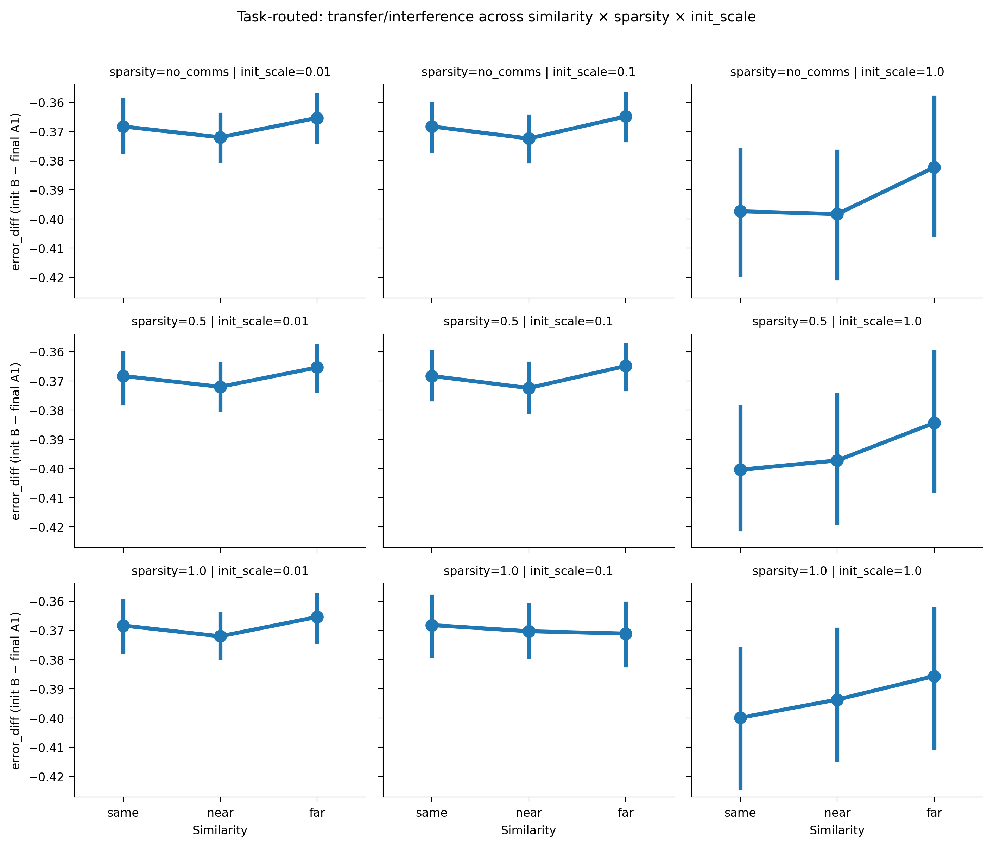

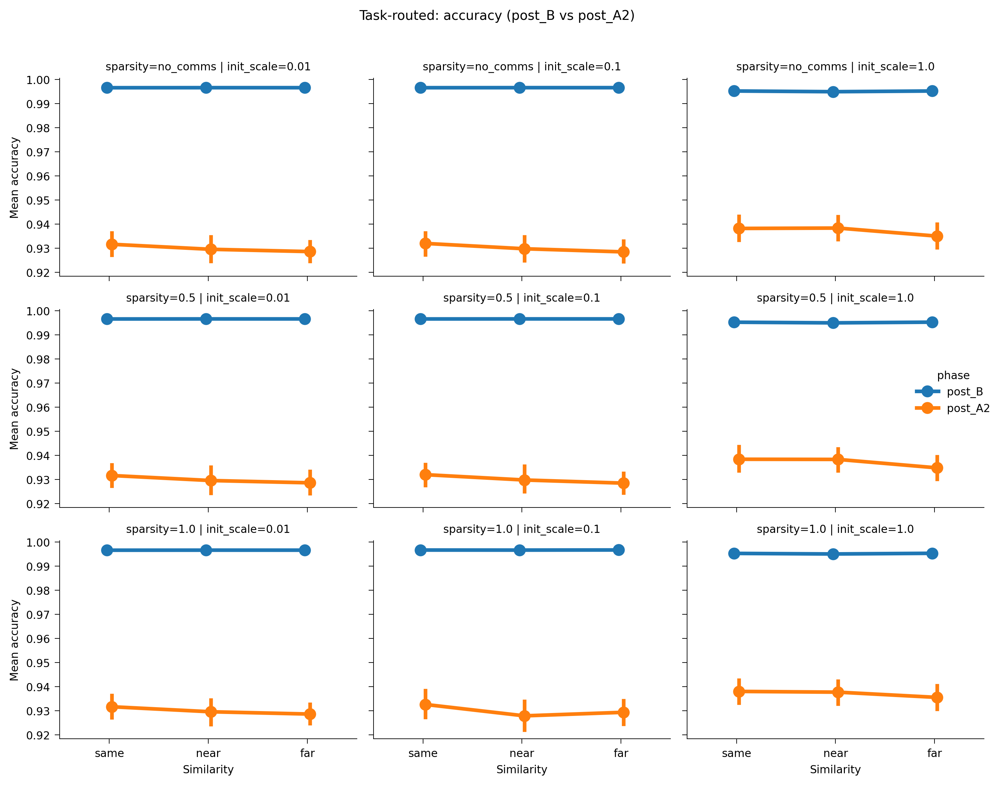

In [14]:
def _facet_orders():
    init_order = [s for s in PAPER_INIT_SCALES if s in INIT_SCALE_ORDER]
    sp_order = [s for s in PAPER_SPARSITIES if s in SPARSITY_ORDER]
    return init_order, sp_order


init_order, sp_order = _facet_orders()

# Transfer/interference
if not transfer_task.empty:
    tr = transfer_task.copy()
    tr["init_scale"] = tr["init_scale"].astype(float)
    g = sns.catplot(
        data=tr,
        x="condition",
        y="error_diff",
        col="init_scale",
        row="sparsity_label",
        col_order=init_order,
        row_order=sp_order,
        kind="point",
        dodge=True,
        order=SIMILARITY_ORDER,
        height=2.6,
        aspect=1.2,
    )
    g.set_axis_labels("Similarity", "error_diff (init B − final A1)")
    g.set_titles(row_template="sparsity={row_name}", col_template="init_scale={col_name}")
    g.fig.suptitle("Task-routed: transfer/interference across similarity × sparsity × init_scale", y=1.02)
    plt.tight_layout()
    plt.show()

# Accuracy in key phases
if not acc_task.empty:
    sub = acc_task[acc_task["phase"].isin(["post_B", "post_A2"])].copy()
    sub["init_scale"] = sub["init_scale"].astype(float)
    g = sns.catplot(
        data=sub,
        x="condition",
        y="mean_accuracy",
        hue="phase",
        col="init_scale",
        row="sparsity_label",
        col_order=init_order,
        row_order=sp_order,
        kind="point",
        dodge=True,
        order=SIMILARITY_ORDER,
        hue_order=["post_B", "post_A2"],
        height=2.6,
        aspect=1.2,
    )
    g.set_axis_labels("Similarity", "Mean accuracy")
    g.set_titles(row_template="sparsity={row_name}", col_template="init_scale={col_name}")
    g.fig.suptitle("Task-routed: accuracy (post_B vs post_A2)", y=1.02)
    plt.tight_layout()
    plt.show()

## Figure 2 (draft): Principal angles between A and B subspaces (task-routed)

Goal: link behavior to representational separation.

Layout: rows = sparsity, columns = init_scale, hue = similarity (same/near/far).

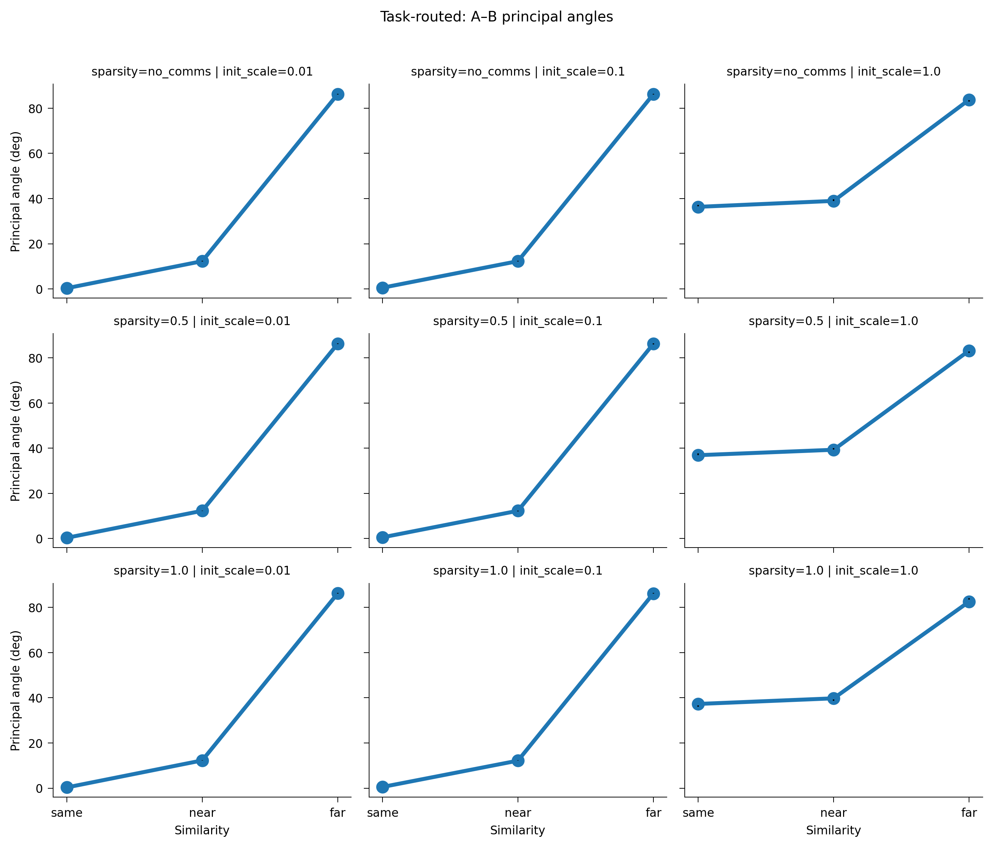

In [15]:
if not angles_task.empty:
    ang = angles_task.copy()
    ang["init_scale"] = ang["init_scale"].astype(float)

    # aggregate to mean ± sem for cleaner paper plot
    ang_agg = (
        ang.groupby(["sparsity_label", "init_scale", "condition"], as_index=False)["principal_angle_between"]
        .agg(["mean", "sem"])
        .reset_index()
        .rename(columns={"mean": "angle_mean", "sem": "angle_sem"})
    )

    g = sns.catplot(
        data=ang_agg,
        x="condition",
        y="angle_mean",
        col="init_scale",
        row="sparsity_label",
        col_order=init_order,
        row_order=sp_order,
        kind="point",
        dodge=True,
        order=SIMILARITY_ORDER,
        height=2.6,
        aspect=1.2,
    )

    # add SEM bars manually
    for ax, (_, subdf) in zip(g.axes.flat, ang_agg.groupby(["sparsity_label", "init_scale"], sort=False)):
        # seaborn positions: 0,1,2 in SIMILARITY_ORDER
        x = np.arange(len(SIMILARITY_ORDER))
        subdf = subdf.set_index("condition").reindex(SIMILARITY_ORDER)
        ax.errorbar(x, subdf["angle_mean"].values, yerr=subdf["angle_sem"].values, fmt="none", c="black", lw=1)

    g.set_axis_labels("Similarity", "Principal angle (deg)")
    g.set_titles(row_template="sparsity={row_name}", col_template="init_scale={col_name}")
    g.fig.suptitle("Task-routed: A–B principal angles", y=1.02)
    plt.tight_layout()
    plt.show()

## Figure 3 (draft): PC count by task similarity and phase (task-routed)

Goal: show **99% variance** PC counts across continual-learning phases.

- **x-axis:** task similarity blocks **Same**, **Near**, **Far**
- **subgroups (hue):** **Post A**, **Post B**, **Post A2**
- **y-axis:** mean **# PCs** (`n_pcs_99`, **combined** pathway)
- **columns:** `init_scale` within each sparsity panel
- **separate figure** per communication sparsity (`PAPER_SPARSITIES`)

Values are **means over participants** per (init_scale × similarity × phase).


/tmp/ipykernel_887274/753288994.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sub.groupby(["init_scale", "condition", "phase"], as_index=False)["n_pcs_99"]


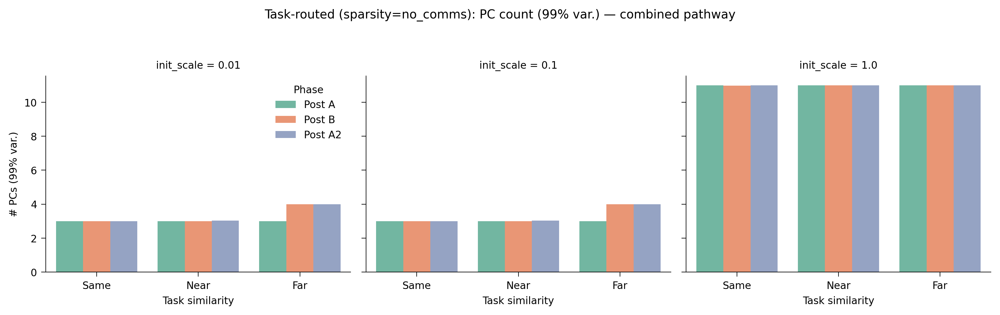

/tmp/ipykernel_887274/753288994.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sub.groupby(["init_scale", "condition", "phase"], as_index=False)["n_pcs_99"]


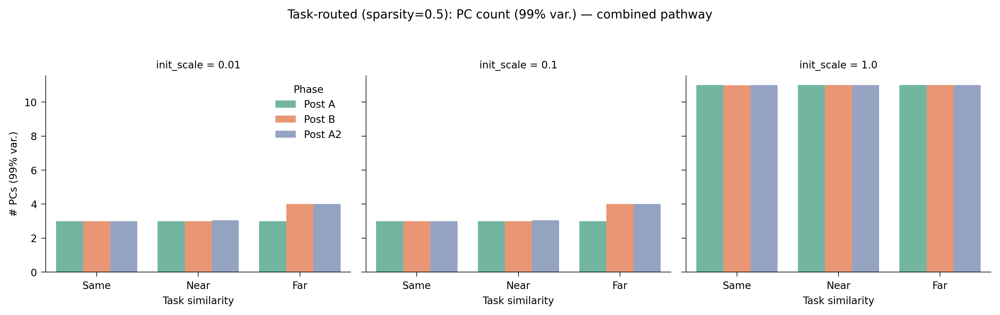

/tmp/ipykernel_887274/753288994.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sub.groupby(["init_scale", "condition", "phase"], as_index=False)["n_pcs_99"]


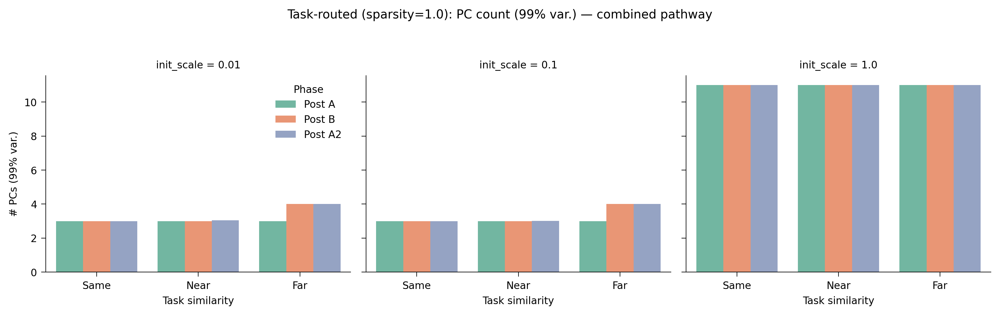

In [16]:
if not rep_task.empty:
    pc = rep_task[(rep_task["pathway"] == "combined")].copy()
    pc["init_scale"] = pc["init_scale"].astype(float)
    pc["phase"] = pd.Categorical(pc["phase"], categories=PHASE_ORDER, ordered=True)
    pc["condition"] = pd.Categorical(pc["condition"], categories=SIMILARITY_ORDER, ordered=True)

    phase_labels = {"post_A": "Post A", "post_B": "Post B", "post_A2": "Post A2"}
    cond_labels = {"same": "Same", "near": "Near", "far": "Far"}

    for sp in PAPER_SPARSITIES:
        sub = pc[pc["sparsity_label"].astype(str) == sp].copy()
        if sub.empty or "n_pcs_99" not in sub.columns:
            continue

        agg = (
            sub.groupby(["init_scale", "condition", "phase"], as_index=False)["n_pcs_99"]
            .mean()
        )
        agg["phase_plot"] = agg["phase"].map(phase_labels)
        agg["condition_plot"] = agg["condition"].map(cond_labels)

        g = sns.catplot(
            data=agg,
            x="condition_plot",
            y="n_pcs_99",
            hue="phase_plot",
            col="init_scale",
            col_order=init_order,
            kind="bar",
            order=["Same", "Near", "Far"],
            hue_order=["Post A", "Post B", "Post A2"],
            palette="Set2",
            height=3.2,
            aspect=1.15,
            legend_out=False,
            errorbar=None,
        )
        g.set_axis_labels("Task similarity", "# PCs (99% var.)")
        g.set_titles("init_scale = {col_name}")
        if g._legend is not None:
            g._legend.set_title("Phase")
        g.fig.suptitle(f"Task-routed (sparsity={sp}): PC count (99% var.) — combined pathway", y=1.06)
        plt.tight_layout()
        plt.show()


## Figure 4 (draft): Curated 2D PCA geometry snapshots (task-routed)

Goal: show qualitative geometry differences without exploding the grid.

Default: use `post_A2`, pathway `combined`, and show a small curated subset.

Draft subset:
- sparsity = `0.5`
- init_scale ∈ {0.01, 0.1, 1.0}
- three panels per figure: similarity (same/near/far)

(You can add `no_comms` and `full` as supplemental versions.)

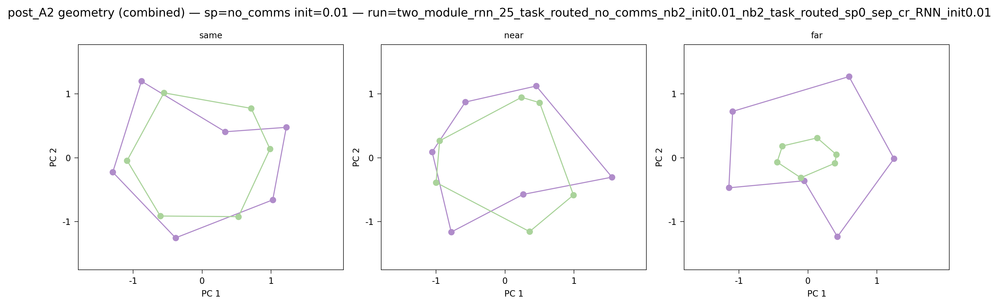

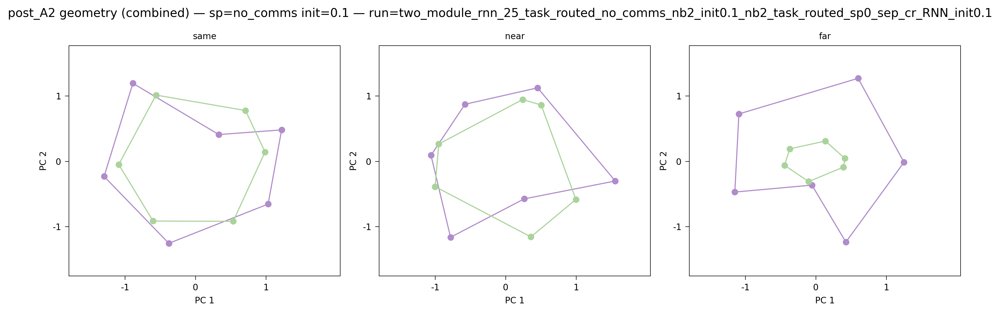

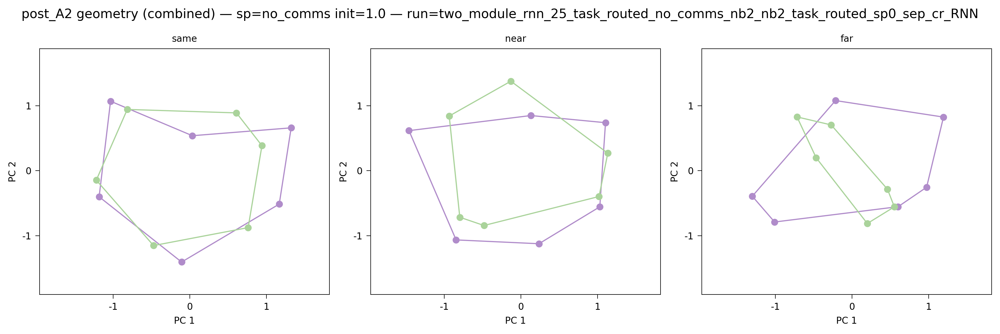

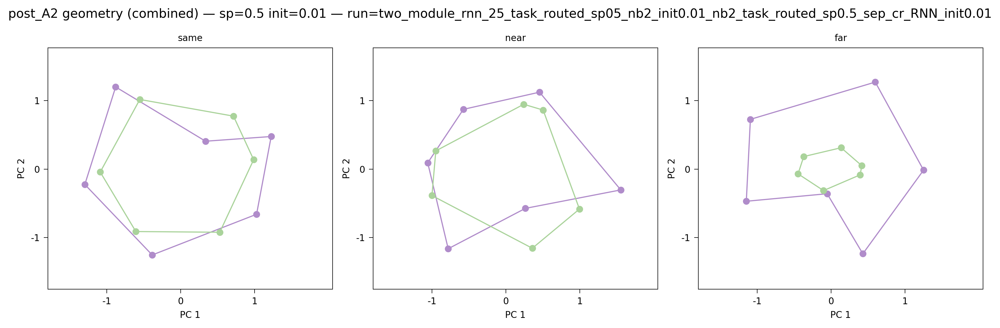

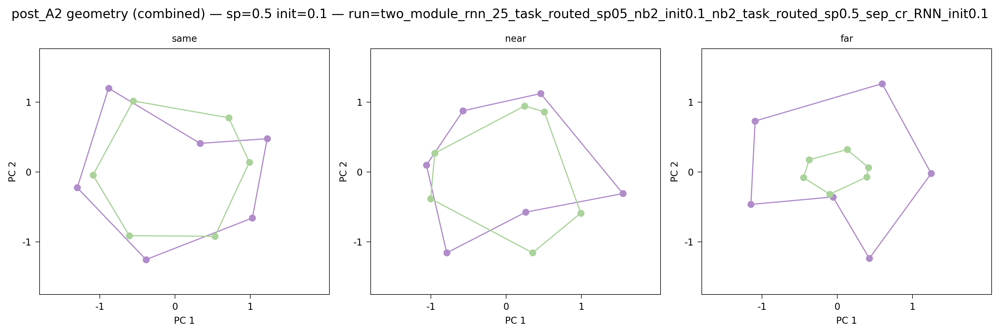

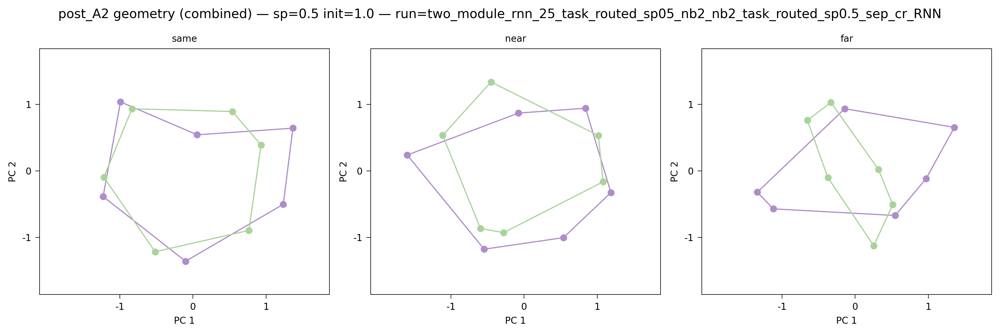

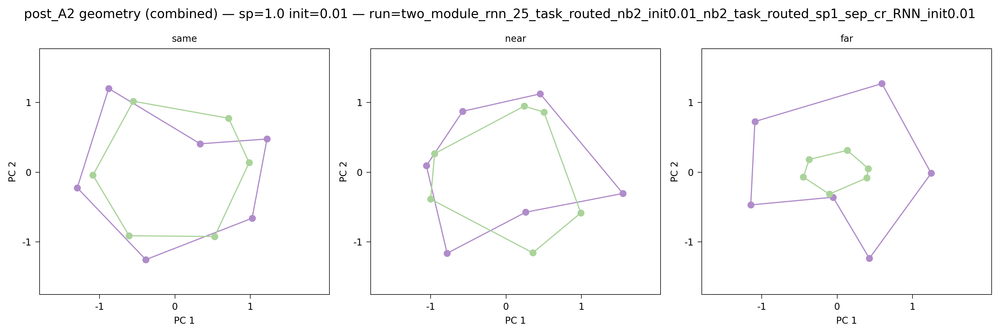

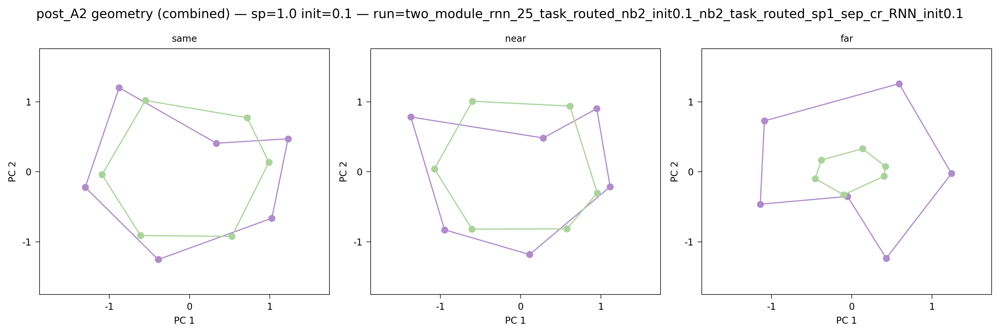

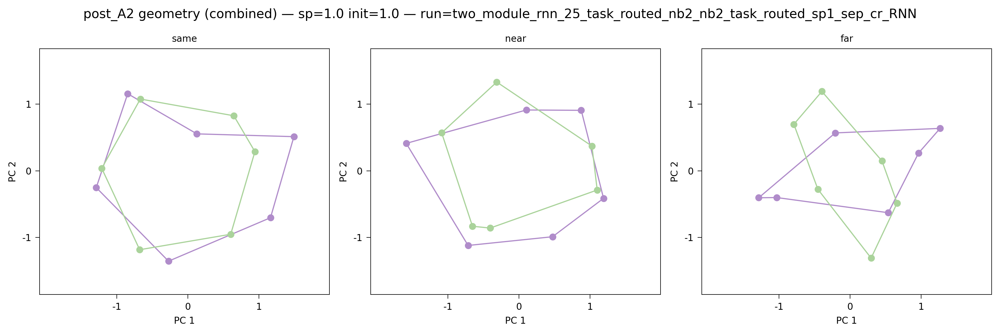

In [17]:
def plot_geometry_snapshot(all_ann_data: dict, target_sp: str, target_init: float, n_stim_plot: int = 12, phase_idx: int = 2):
    # pick the first run that matches (sp, init)
    candidates = [
        (rid, b) for rid, b in all_ann_data.items()
        if str(b["sparsity_label"]) == str(target_sp) and float(b["init_scale"]) == float(target_init)
    ]
    if not candidates:
        print("No candidate run found for", target_sp, target_init)
        return

    run_id, bundle = candidates[0]
    ann_data = bundle["data"]

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    fig.suptitle(f"post_A2 geometry (combined) — sp={target_sp} init={target_init} — run={run_id}", fontsize=11)

    all_2d = []
    for cond in SIMILARITY_ORDER:
        entries = ann_data.get(cond, [])
        if not entries:
            all_2d.append(None)
            continue
        entry = entries[0]
        hids = np.asarray(entry.get(f"hiddens_post_phase_{phase_idx}"))
        if hids is None or hids.size == 0 or hids.shape[0] < n_stim_plot:
            all_2d.append(None)
            continue
        hids = hids[:n_stim_plot]
        _, X2 = prepare_pca_single_task(hids)
        all_2d.append(X2)

    valid = [x for x in all_2d if x is not None]
    lims_global = get_axis_limits(np.vstack(valid)) if valid else {}

    for ax, cond, X2 in zip(axes, SIMILARITY_ORDER, all_2d):
        if X2 is None:
            ax.set_title(f"{cond} (no data)")
            ax.axis("off")
            continue
        plot_split_stim(ax, X2, task_colours, lims_global)
        ax.set_title(cond)

    plt.tight_layout()
    plt.show()


for target_sp in ["no_comms", "0.5", "1.0"]:
    for init_scale in PAPER_INIT_SCALES:
        plot_geometry_snapshot(all_task, target_sp=target_sp, target_init=float(init_scale))

## Appendix: 3D PCA geometry snapshots (PC1, PC2, PC3)

This is an appendix-style extension of Figure 4 to preview whether adding the 3rd component clarifies separation patterns.

- x-axis: PC1
- y-axis: PC2
- z-axis: PC3

Curated subset matches Figure 4: sparsity in `{no_comms, 0.5, 1.0}` and init_scale in `{0.01, 0.1, 1.0}`.

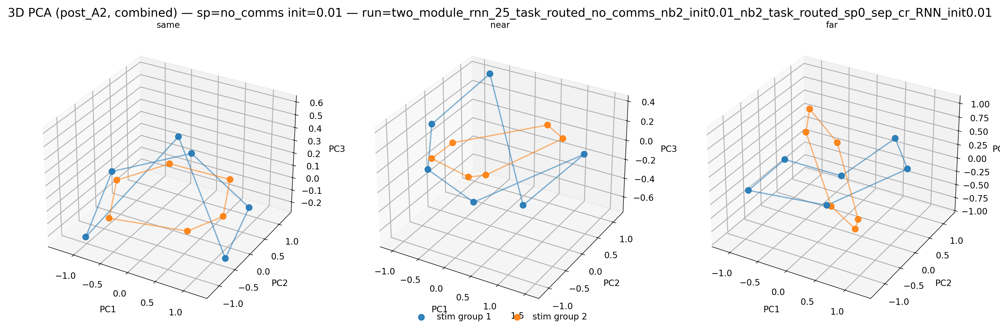

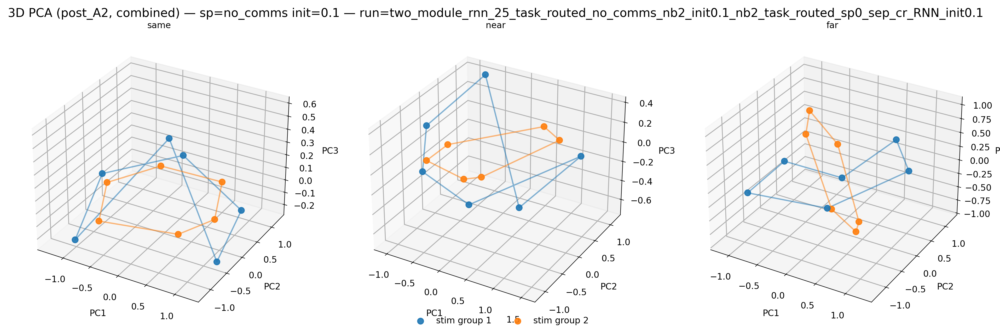

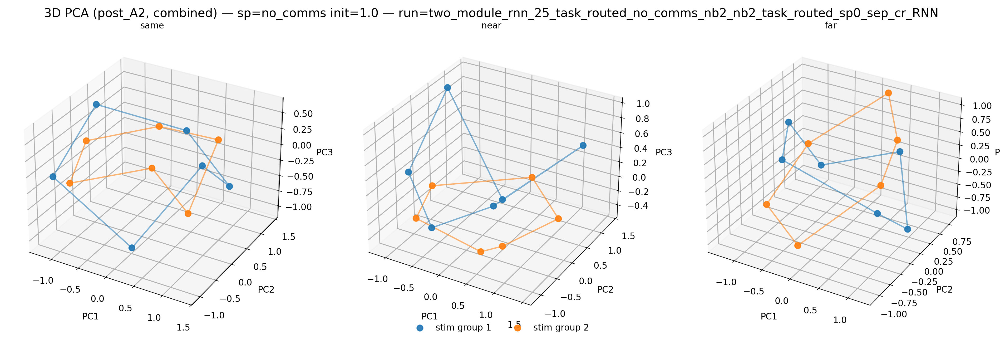

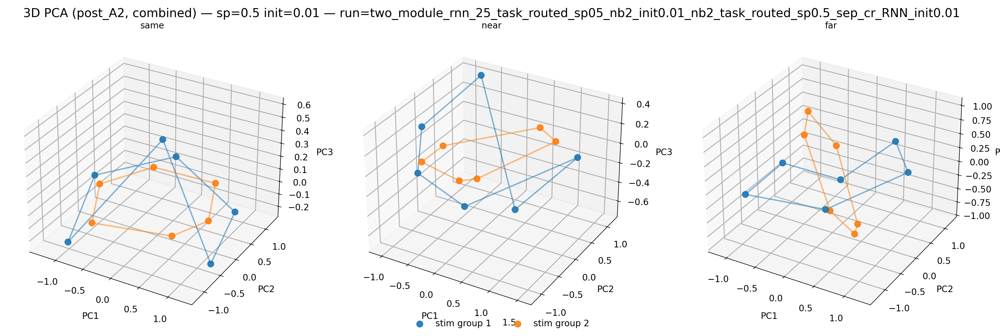

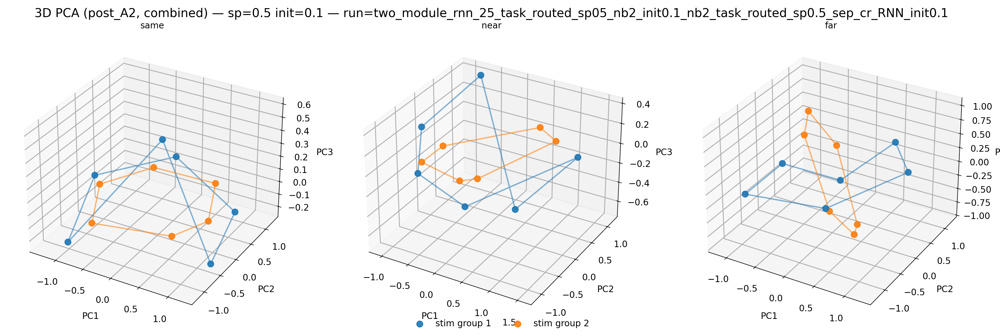

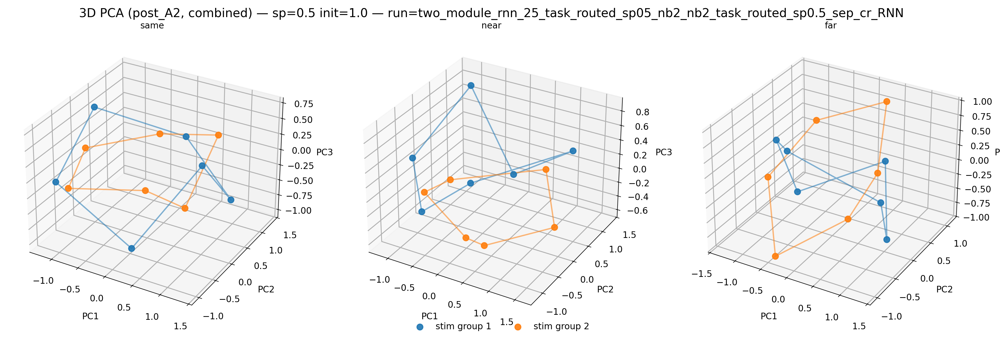

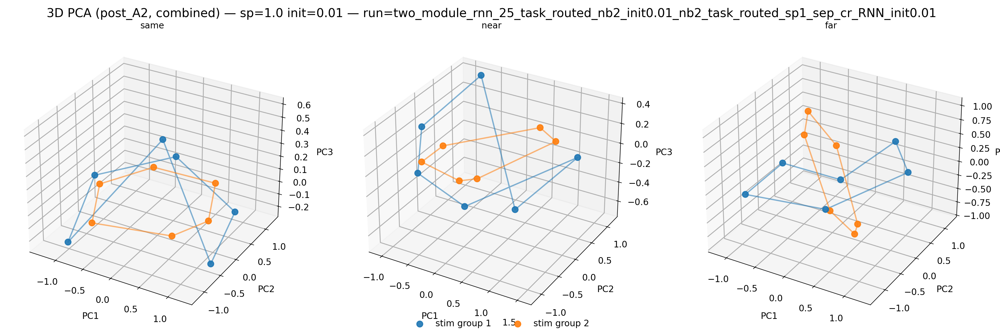

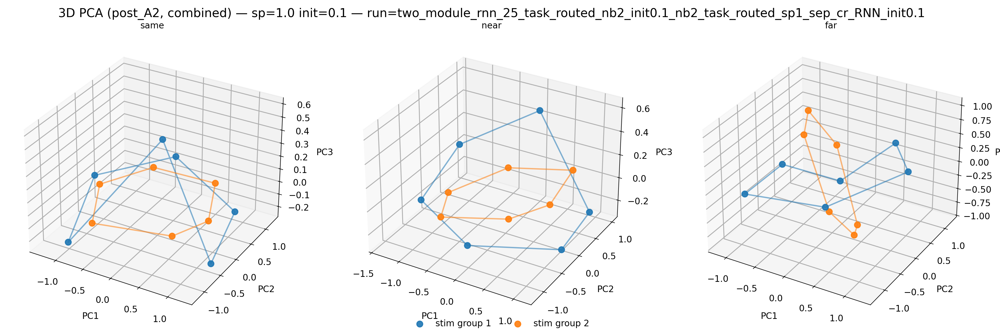

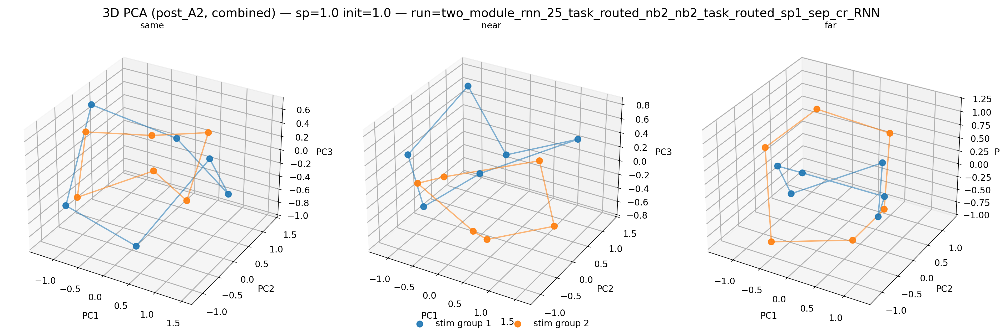

In [18]:
# 3D PCA snapshots (task-routed)
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401


def pca_3d(X):
    X = np.asarray(X)
    Xc = X - X.mean(axis=0, keepdims=True)
    # SVD-based PCA projection
    _, _, vt = np.linalg.svd(Xc, full_matrices=False)
    comps = vt[:3].T
    return Xc @ comps


def plot_geometry_snapshot_3d(all_ann_data: dict, target_sp: str, target_init: float, n_stim_plot: int = 12, phase_idx: int = 2):
    candidates = [
        (rid, b) for rid, b in all_ann_data.items()
        if str(b["sparsity_label"]) == str(target_sp) and float(b["init_scale"]) == float(target_init)
    ]
    if not candidates:
        print("No candidate run found for", target_sp, target_init)
        return

    run_id, bundle = candidates[0]
    ann_data = bundle["data"]

    fig = plt.figure(figsize=(13, 4.2))
    fig.suptitle(f"3D PCA (post_A2, combined) — sp={target_sp} init={target_init} — run={run_id}", fontsize=11)

    for i, cond in enumerate(SIMILARITY_ORDER, start=1):
        ax = fig.add_subplot(1, 3, i, projection="3d")
        entries = ann_data.get(cond, [])
        if not entries:
            ax.set_title(f"{cond} (no data)")
            continue

        entry = entries[0]
        hids = np.asarray(entry.get(f"hiddens_post_phase_{phase_idx}"))
        if hids is None or hids.size == 0 or hids.shape[0] < n_stim_plot:
            ax.set_title(f"{cond} (insufficient)")
            continue

        hids = hids[:n_stim_plot]
        X3 = pca_3d(hids)

        # split by first half / second half stimuli like the 2D plot style
        n = X3.shape[0]
        cut = n // 2
        g1 = X3[:cut]
        g2 = X3[cut:]

        # Draw closed circular trajectories (connect last point back to first)
        if len(g1) > 1:
            g1_closed = np.vstack([g1, g1[0]])
            ax.plot(g1_closed[:, 0], g1_closed[:, 1], g1_closed[:, 2], alpha=0.55, linewidth=1.2)
        if len(g2) > 1:
            g2_closed = np.vstack([g2, g2[0]])
            ax.plot(g2_closed[:, 0], g2_closed[:, 1], g2_closed[:, 2], alpha=0.55, linewidth=1.2)

        ax.scatter(g1[:, 0], g1[:, 1], g1[:, 2], s=28, alpha=0.9, label="stim group 1")
        ax.scatter(g2[:, 0], g2[:, 1], g2[:, 2], s=28, alpha=0.9, label="stim group 2")

        ax.set_title(cond)
        ax.set_xlabel("PC1")
        ax.set_ylabel("PC2")
        ax.set_zlabel("PC3")

    handles, labels = ax.get_legend_handles_labels()
    if handles:
        fig.legend(handles, labels, loc="lower center", ncol=2, frameon=False)

    plt.tight_layout()
    plt.show()


for target_sp in ["no_comms", "0.5", "1.0"]:
    for init_scale in PAPER_INIT_SCALES:
        plot_geometry_snapshot_3d(all_task, target_sp=target_sp, target_init=float(init_scale))

## Figure 5 (draft): Shared vs task-routed ablation (matched paper grid)

Goal: treat **shared** as an ablation and compare to the **task-routed** default.

Suggested minimal view (for first draft):
- Same figure layouts as above but with a single additional facet: `routing ∈ {task_routed, shared}`.

Below we show two compact comparisons:
- Transfer/interference (`error_diff`)
- A–B principal angles

Layout: rows = sparsity, columns = init_scale, hue = similarity, and separate figures by metric.

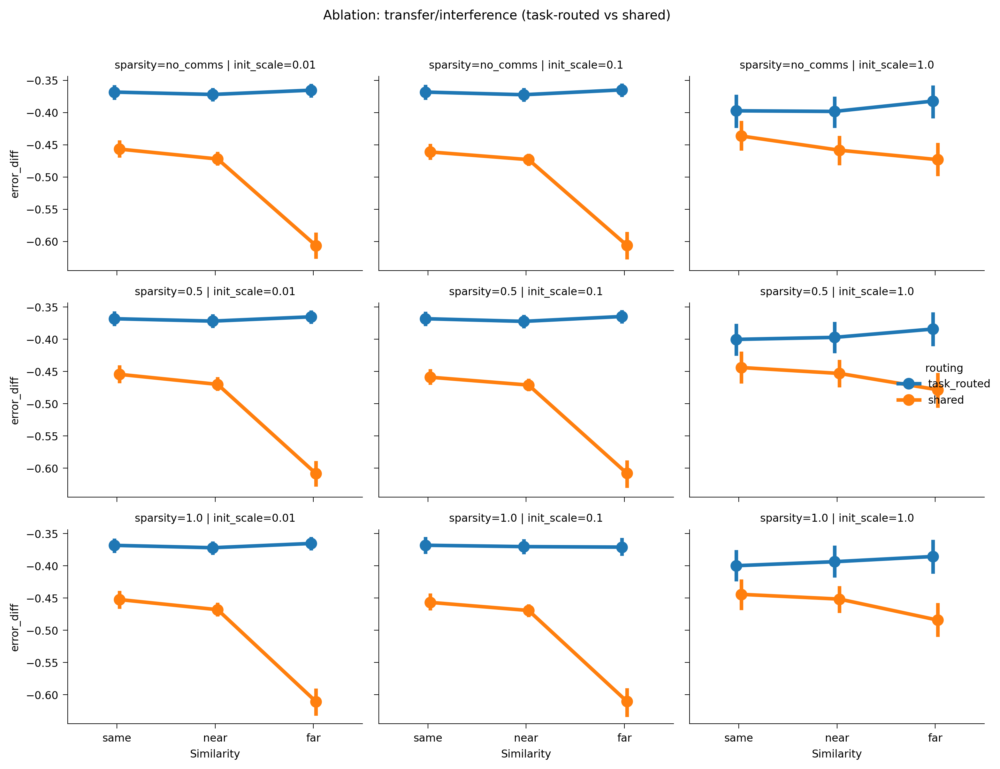

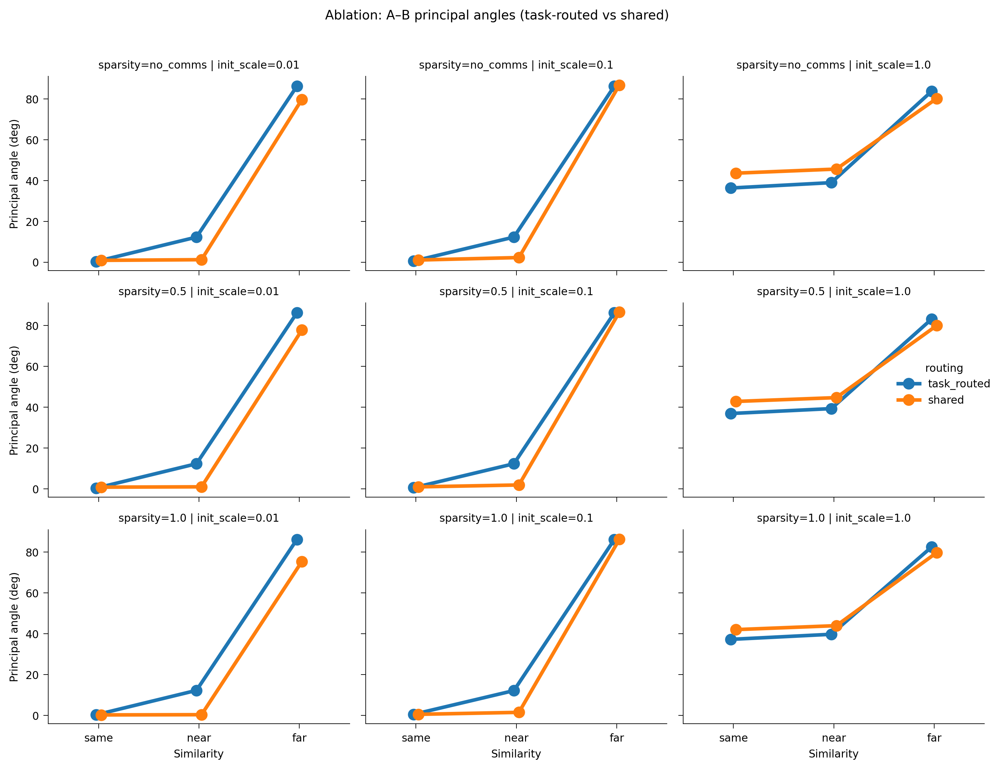

In [19]:
def add_routing_label(df: pd.DataFrame, routing: str):
    if df is None or df.empty:
        return pd.DataFrame()
    out = df.copy()
    out["routing"] = routing
    return out

tr_both = pd.concat([
    add_routing_label(transfer_task, "task_routed"),
    add_routing_label(transfer_shared, "shared"),
], ignore_index=True)

ang_both = pd.concat([
    add_routing_label(angles_task, "task_routed"),
    add_routing_label(angles_shared, "shared"),
], ignore_index=True)

# Transfer comparison
if not tr_both.empty:
    g = sns.catplot(
        data=tr_both,
        x="condition",
        y="error_diff",
        hue="routing",
        col="init_scale",
        row="sparsity_label",
        col_order=init_order,
        row_order=sp_order,
        kind="point",
        dodge=True,
        order=SIMILARITY_ORDER,
        hue_order=["task_routed", "shared"],
        height=2.6,
        aspect=1.2,
    )
    g.set_axis_labels("Similarity", "error_diff")
    g.set_titles(row_template="sparsity={row_name}", col_template="init_scale={col_name}")
    g.fig.suptitle("Ablation: transfer/interference (task-routed vs shared)", y=1.02)
    plt.tight_layout()
    plt.show()

# Angle comparison (aggregate first)
if not ang_both.empty:
    ang_both["init_scale"] = ang_both["init_scale"].astype(float)
    agg = (
        ang_both.groupby(["routing", "sparsity_label", "init_scale", "condition"], as_index=False)["principal_angle_between"]
        .mean()
        .rename(columns={"principal_angle_between": "angle_mean"})
    )
    g = sns.catplot(
        data=agg,
        x="condition",
        y="angle_mean",
        hue="routing",
        col="init_scale",
        row="sparsity_label",
        col_order=init_order,
        row_order=sp_order,
        kind="point",
        dodge=True,
        order=SIMILARITY_ORDER,
        hue_order=["task_routed", "shared"],
        height=2.6,
        aspect=1.2,
    )
    g.set_axis_labels("Similarity", "Principal angle (deg)")
    g.set_titles(row_template="sparsity={row_name}", col_template="init_scale={col_name}")
    g.fig.suptitle("Ablation: A–B principal angles (task-routed vs shared)", y=1.02)
    plt.tight_layout()
    plt.show()

## Appendix: Holton-style plots (A1–B–A2 analogues)

Holton (and related continual-learning behavioral analyses) often show two complementary views:

1. **Task-B transfer**: performance at the start of B relative to A1 end.
2. **Retest interference**: during A2, how much behavior looks like applying the *B rule* instead of the A rule.

Because A1B2 is **circular regression**, we cannot plot `p(rule B)` directly. Instead we compute a close analogue: **B-likeness during A2**, defined as whether the predicted angle is closer to the *B target* than the *A target* for the same stimulus (estimated from labels in A1 and B).


holton_tr_test: (0, 0)
holton_tr_all : (5371, 10)


""


,routing,run_id,participant,sparsity_label,init_scale,condition,b_transfer_delta,k,use_test_only,probe_filter
0,task_routed,two_module_rnn_25_task_routed_no_comms_nb2_ini...,sim_study2_same_sub9,no_comms,0.01,same,-0.343588,6,False,None
1,task_routed,two_module_rnn_25_task_routed_no_comms_nb2_ini...,sim_study1_same_sub58,no_comms,0.01,same,-0.144997,6,False,None
2,task_routed,two_module_rnn_25_task_routed_no_comms_nb2_ini...,sim_study2_same_sub32,no_comms,0.01,same,-0.492035,6,False,None
3,task_routed,two_module_rnn_25_task_routed_no_comms_nb2_ini...,sim_study1_same_sub9,no_comms,0.01,same,-0.271821,6,False,None
4,task_routed,two_module_rnn_25_task_routed_no_comms_nb2_ini...,sim_study1_same_sub40,no_comms,0.01,same,-0.535166,6,False,None


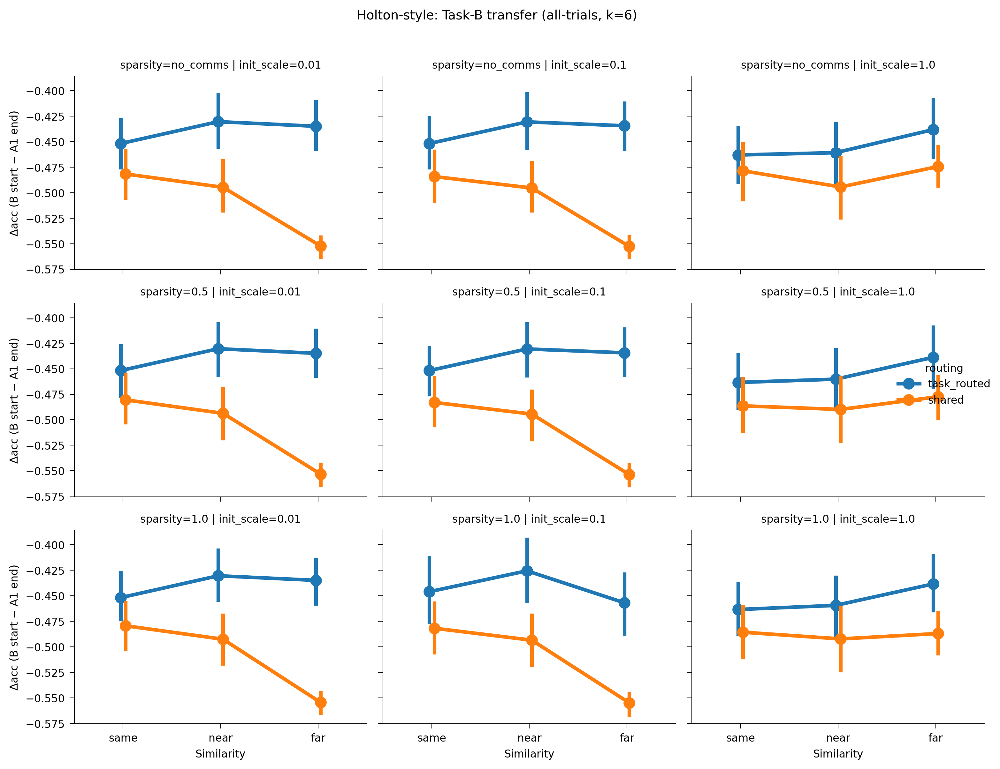

In [20]:
# A.1 Holton-style B transfer (delta accuracy)

def _get_cond_arrays(entry, key, cond_idx=None):
    arr = np.asarray(entry[key])
    if arr.ndim == 3 and cond_idx is not None:
        return arr[cond_idx]
    return arr


def _phase_mask_test(entry, phase_idx, cond_idx=None):
    if "test_stim" not in entry or entry["test_stim"] is None:
        return None
    ts = np.asarray(entry["test_stim"])
    if ts.ndim == 3 and cond_idx is not None:
        ts = ts[cond_idx]
    if ts.ndim >= 2:
        m = ts[phase_idx].astype(float)
        return (m == 1)
    return None


def _phase_mask_probe(entry, phase_idx, wanted_probe: int, cond_idx=None):
    if "probes" not in entry or entry["probes"] is None:
        return None
    pr = np.asarray(entry["probes"])
    if pr.ndim == 3 and cond_idx is not None:
        pr = pr[cond_idx]
    if pr.ndim >= 2:
        p = pr[phase_idx].astype(int)
        return (p == int(wanted_probe))
    return None


def holton_transfer_df(all_ann_data, routing_label: str, k=6, use_test_only=True, probe_filter=None):
    rows = []
    for run_id, bundle in all_ann_data.items():
        init_scale = float(bundle["init_scale"])
        sp_label = str(bundle["sparsity_label"])
        ann_data = bundle["data"]

        for cond_name in SIMILARITY_ORDER:
            entries = ann_data.get(cond_name, [])
            for entry in entries:
                pid = str(entry.get("participant"))

                # Handle possibility that arrays include a condition axis.
                cond_idx = SIMILARITY_ORDER.index(cond_name)

                acc = _get_cond_arrays(entry, "accuracy", cond_idx=cond_idx)
                if acc.ndim < 2 or acc.shape[0] < 2:
                    continue

                A1 = np.asarray(acc[0]).astype(float)
                B = np.asarray(acc[1]).astype(float)

                if use_test_only:
                    mA = _phase_mask_test(entry, 0, cond_idx=cond_idx)
                    mB = _phase_mask_test(entry, 1, cond_idx=cond_idx)
                else:
                    mA = None
                    mB = None

                if probe_filter is not None:
                    mpA = _phase_mask_probe(entry, 0, wanted_probe=probe_filter, cond_idx=cond_idx)
                    mpB = _phase_mask_probe(entry, 1, wanted_probe=probe_filter, cond_idx=cond_idx)
                    mA = (mA & mpA) if (mA is not None and mpA is not None) else (mpA if mA is None else mA)
                    mB = (mB & mpB) if (mB is not None and mpB is not None) else (mpB if mB is None else mB)

                A1_sel = A1[mA] if mA is not None else A1
                B_sel = B[mB] if mB is not None else B

                if len(A1_sel) < k or len(B_sel) < k:
                    continue

                a1_late = float(np.nanmean(A1_sel[-k:]))
                b_early = float(np.nanmean(B_sel[:k]))

                rows.append({
                    "routing": routing_label,
                    "run_id": run_id,
                    "participant": pid,
                    "sparsity_label": sp_label,
                    "init_scale": init_scale,
                    "condition": cond_name,
                    "b_transfer_delta": b_early - a1_late,
                    "k": int(k),
                    "use_test_only": bool(use_test_only),
                    "probe_filter": probe_filter,
                })

    return pd.DataFrame(rows)


# Prefer test-only Holton-like selection when available; fall back to the original notebook-style slice otherwise.
holton_tr_task_test = holton_transfer_df(all_task, "task_routed", k=6, use_test_only=True, probe_filter=None)
holton_tr_shared_test = holton_transfer_df(all_shared, "shared", k=6, use_test_only=True, probe_filter=None)
holton_tr_test = pd.concat([holton_tr_task_test, holton_tr_shared_test], ignore_index=True)

holton_tr_task_all = holton_transfer_df(all_task, "task_routed", k=6, use_test_only=False, probe_filter=None)
holton_tr_shared_all = holton_transfer_df(all_shared, "shared", k=6, use_test_only=False, probe_filter=None)
holton_tr_all = pd.concat([holton_tr_task_all, holton_tr_shared_all], ignore_index=True)

print("holton_tr_test:", holton_tr_test.shape)
print("holton_tr_all :", holton_tr_all.shape)

display(holton_tr_test.head())
display(holton_tr_all.head())

holton_tr = holton_tr_test if not holton_tr_test.empty else holton_tr_all
mode = "test-only" if holton_tr is holton_tr_test else "all-trials"

if not holton_tr.empty:
    sub = holton_tr[
        holton_tr["init_scale"].isin(PAPER_INIT_SCALES)
        & holton_tr["sparsity_label"].isin(PAPER_SPARSITIES)
    ].copy()

    g = sns.catplot(
        data=sub,
        x="condition",
        y="b_transfer_delta",
        hue="routing",
        col="init_scale",
        row="sparsity_label",
        col_order=PAPER_INIT_SCALES,
        row_order=PAPER_SPARSITIES,
        kind="point",
        dodge=True,
        order=SIMILARITY_ORDER,
        hue_order=["task_routed", "shared"],
        height=2.6,
        aspect=1.2,
    )
    g.set_axis_labels("Similarity", "Δacc (B start − A1 end)")
    g.set_titles(row_template="sparsity={row_name}", col_template="init_scale={col_name}")
    g.fig.suptitle(f"Holton-style: Task-B transfer ({mode}, k=6)", y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("No rows for Holton-style transfer (both test-only and all-trials empty).")